In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, mean_squared_error, confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, log_loss, confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import binarize
import math


In [2]:
df=pd.read_csv("Edmonton_South_Daily_Readings.csv")
df.head()

,IntervalStart,IntervalEnd,Carbon Monoxide (ppm),Nitric Oxide(ppm),Chemiluminescence(ppm),Outdoor Air Temperature(deg),Ozone(ppm),Std. Dev. of Wind Direction(deg),Sulphur Dioxide(ppm),Total Oxides Of Nitrogen(ppm),Wind Direction(deg),Wind Speed(km/hr)
0,01/01/2015 00:00:00,01/01/2015 00:59:00,0.2,0.0002,0.0012,10.0,0.033,13.0,0.0,0.0014,308.0,10.6
1,01/01/2015 01:00:00,01/01/2015 01:59:00,0.2,0.0003,0.0024,9.5,0.032,13.0,0.0,0.0027,311.0,9.6
2,01/01/2015 02:00:00,01/01/2015 02:59:00,0.2,0.0001,0.0019,12.6,0.032,13.0,0.0,0.0020,308.0,8.5
3,01/01/2015 03:00:00,01/01/2015 03:59:00,0.2,0.0001,0.0011,8.8,0.033,12.0,0.0,0.0012,299.0,8.6
4,01/01/2015 04:00:00,01/01/2015 04:59:00,0.2,0.0001,0.0010,9.7,0.032,14.0,0.0,0.0011,287.0,7.7


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71520 entries, 0 to 71519
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   IntervalStart                     71520 non-null  object 
 1   IntervalEnd                       71520 non-null  object 
 2   Carbon Monoxide (ppm)             58560 non-null  float64
 3   Nitric Oxide(ppm)                 58195 non-null  float64
 4   Chemiluminescence(ppm)            58195 non-null  float64
 5   Outdoor Air Temperature(deg)      59444 non-null  float64
 6   Ozone(ppm)                        58046 non-null  float64
 7   Std. Dev. of Wind Direction(deg)  40322 non-null  float64
 8   Sulphur Dioxide(ppm)              59028 non-null  float64
 9   Total Oxides Of Nitrogen(ppm)     58195 non-null  float64
 10  Wind Direction(deg)               58852 non-null  float64
 11  Wind Speed(km/hr)                 57546 non-null  float64
dtypes: f

In [4]:
# convert the datetime column to datetime format
df['IntervalStart'] = pd.to_datetime(df['IntervalStart'])

# extract the date and time values into separate columns
df['Start_date'] = df['IntervalStart'].dt.date
df['Start_time'] = df['IntervalStart'].dt.time


# drop the original datetime column
df.drop('IntervalStart', axis=1, inplace=True)

# print the final dataframe
df.head(5)

,IntervalEnd,Carbon Monoxide (ppm),Nitric Oxide(ppm),Chemiluminescence(ppm),Outdoor Air Temperature(deg),Ozone(ppm),Std. Dev. of Wind Direction(deg),Sulphur Dioxide(ppm),Total Oxides Of Nitrogen(ppm),Wind Direction(deg),Wind Speed(km/hr),Start_date,Start_time
0,01/01/2015 00:59:00,0.2,0.0002,0.0012,10.0,0.033,13.0,0.0,0.0014,308.0,10.6,2015-01-01,00:00:00
1,01/01/2015 01:59:00,0.2,0.0003,0.0024,9.5,0.032,13.0,0.0,0.0027,311.0,9.6,2015-01-01,01:00:00
2,01/01/2015 02:59:00,0.2,0.0001,0.0019,12.6,0.032,13.0,0.0,0.0020,308.0,8.5,2015-01-01,02:00:00
3,01/01/2015 03:59:00,0.2,0.0001,0.0011,8.8,0.033,12.0,0.0,0.0012,299.0,8.6,2015-01-01,03:00:00
4,01/01/2015 04:59:00,0.2,0.0001,0.0010,9.7,0.032,14.0,0.0,0.0011,287.0,7.7,2015-01-01,04:00:00


In [5]:
# convert the datetime column to datetime format
df['IntervalEnd'] = pd.to_datetime(df['IntervalEnd'])

# extract the date and time values into separate columns
df['End_date'] = df['IntervalEnd'].dt.date
df['End_time'] = df['IntervalEnd'].dt.time


# drop the original datetime column
df.drop('IntervalEnd', axis=1, inplace=True)

# print the final dataframe
df.head(5)

,Carbon Monoxide (ppm),Nitric Oxide(ppm),Chemiluminescence(ppm),Outdoor Air Temperature(deg),Ozone(ppm),Std. Dev. of Wind Direction(deg),Sulphur Dioxide(ppm),Total Oxides Of Nitrogen(ppm),Wind Direction(deg),Wind Speed(km/hr),Start_date,Start_time,End_date,End_time
0,0.2,0.0002,0.0012,10.0,0.033,13.0,0.0,0.0014,308.0,10.6,2015-01-01,00:00:00,2015-01-01,00:59:00
1,0.2,0.0003,0.0024,9.5,0.032,13.0,0.0,0.0027,311.0,9.6,2015-01-01,01:00:00,2015-01-01,01:59:00
2,0.2,0.0001,0.0019,12.6,0.032,13.0,0.0,0.0020,308.0,8.5,2015-01-01,02:00:00,2015-01-01,02:59:00
3,0.2,0.0001,0.0011,8.8,0.033,12.0,0.0,0.0012,299.0,8.6,2015-01-01,03:00:00,2015-01-01,03:59:00
4,0.2,0.0001,0.0010,9.7,0.032,14.0,0.0,0.0011,287.0,7.7,2015-01-01,04:00:00,2015-01-01,04:59:00


In [6]:
df.isnull().sum()

Carbon Monoxide (ppm)               12960
Nitric Oxide(ppm)                   13325
Chemiluminescence(ppm)              13325
Outdoor Air Temperature(deg)        12076
Ozone(ppm)                          13474
Std. Dev. of Wind Direction(deg)    31198
Sulphur Dioxide(ppm)                12492
Total Oxides Of Nitrogen(ppm)       13325
Wind Direction(deg)                 12668
Wind Speed(km/hr)                   13974
Start_date                              0
Start_time                              0
End_date                                0
End_time                                0
dtype: int64

In [7]:
df.shape

(71520, 14)

In [8]:
df=df.dropna(axis=0)

In [9]:
df.shape

(35322, 14)

In [10]:
df.describe()

,Carbon Monoxide (ppm),Nitric Oxide(ppm),Chemiluminescence(ppm),Outdoor Air Temperature(deg),Ozone(ppm),Std. Dev. of Wind Direction(deg),Sulphur Dioxide(ppm),Total Oxides Of Nitrogen(ppm),Wind Direction(deg),Wind Speed(km/hr)
count,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000,35322.000000
mean,0.214736,0.003849,0.010055,5.766112,0.024684,24.535530,0.000405,0.013903,203.669554,7.721304
std,0.130143,0.010344,0.009374,11.727402,0.013914,14.541175,0.001115,0.017654,90.787313,4.618778
min,0.000000,0.000000,0.000000,-33.400000,0.000000,2.000000,0.000000,0.000000,0.000000,0.100000
25%,0.200000,0.000200,0.003400,-1.600000,0.014000,16.000000,0.000000,0.004000,147.000000,4.300000
50%,0.200000,0.000700,0.006900,6.400000,0.024000,20.000000,0.000000,0.008200,197.000000,6.700000
75%,0.200000,0.002700,0.013300,14.700000,0.034000,28.000000,0.001000,0.016200,284.000000,10.200000
max,5.700000,0.191300,0.059400,34.400000,0.082000,406.000000,0.036000,0.240700,360.000000,41.500000


In [11]:
# To check wether there unique values in Dataset
df.apply(lambda x: len(x.unique()))

Carbon Monoxide (ppm)                 23
Nitric Oxide(ppm)                    787
Chemiluminescence(ppm)               524
Outdoor Air Temperature(deg)         633
Ozone(ppm)                            81
Std. Dev. of Wind Direction(deg)     128
Sulphur Dioxide(ppm)                  26
Total Oxides Of Nitrogen(ppm)       1131
Wind Direction(deg)                  361
Wind Speed(km/hr)                    307
Start_date                          1590
Start_time                            24
End_date                            1590
End_time                              24
dtype: int64

In [19]:
import plotly.express as px
for i in df.columns[:8]:
    fig_CO = px.line(df, x='Start_date', y= i)
    fig_CO.show()

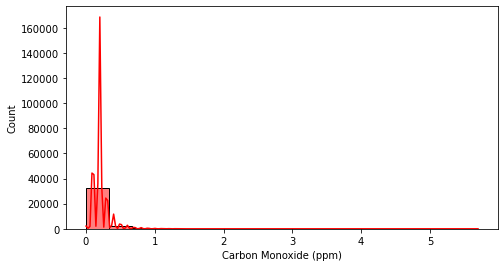

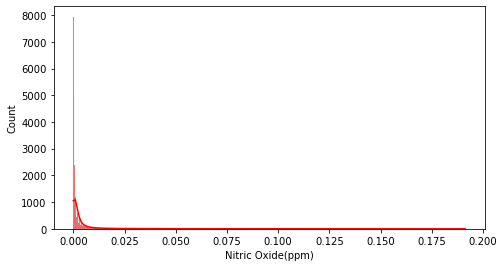

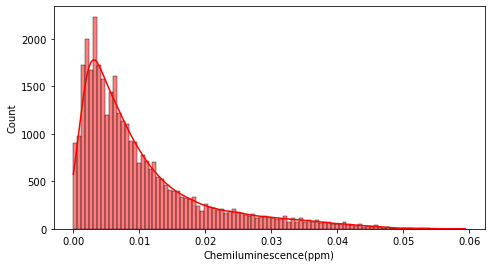

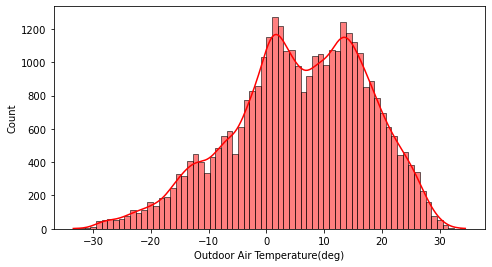

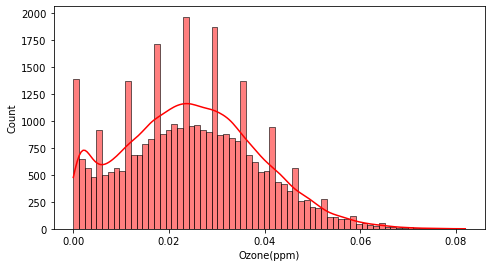

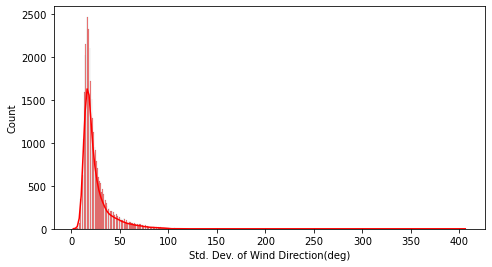

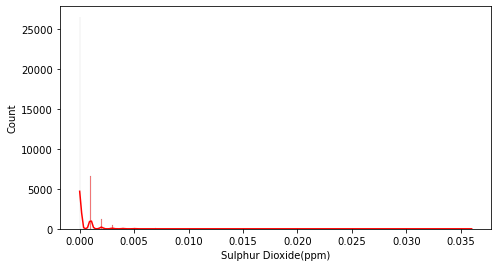

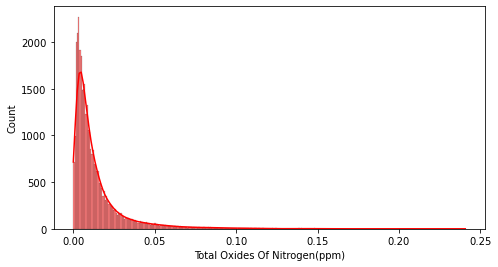

In [13]:
for i in df.columns[:8]:
    plt.figure(figsize=(17,9))
    plt.subplot(2,2,1)
    sns.histplot(x=df[i],stat="count",color="red",kde={'alpha':0.5})

In [14]:
df['Start_date']=df['Start_date'].astype('datetime64[ns]')
df['Week Day'] = df['Start_date'].dt.day_name() 

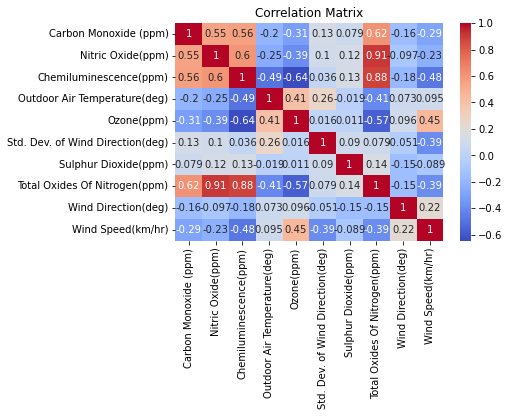

In [15]:
sns.heatmap(df.corr(),annot=True,cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.rcParams["figure.figsize"]=(17,5)
plt.show()

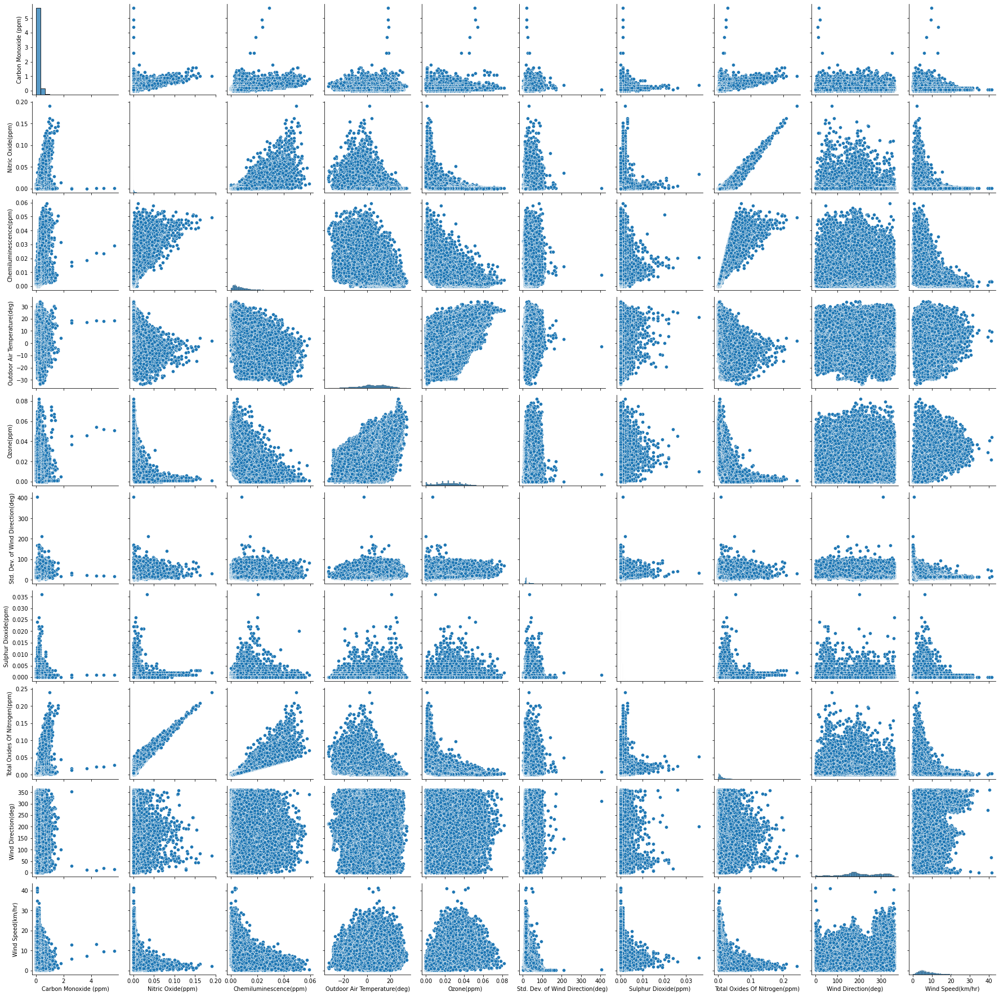

In [16]:
sns.pairplot(df)